In [1]:
import numpy as np
import muram as muram
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

In [2]:
# Slice files written every 10 sec (50 time steps)
# Reduced vertical extent subdomains (for RT modeling) every 30 sec (150 time steps)
# Full 3D dumos every 10 minutes (3000 time steps)

# Grid spacing 16km
# Domain size 512x1536x1536
# tau=1 about grid layer 386 (see below)

# Equation of state uses "old" abundaces -> Anders 89, electron density is provided (see below)

In [2]:
path = "/dat/milic/2D/"
#path='/home/stefani/data/'
B_unit=np.sqrt(4*np.pi)
iter=16500

In [3]:
data = muram.MuramTauSlice(path,iter,1.0)

1 pixel = 16 km. I need axis to be in Mm. 1 pixel = 16 km = 16000 m = 16000 / 1e6 = 0.016 Mm
This means that I need to multiply my pixels with 0.016

I can use extent : https://stackoverflow.com/questions/18696122/change-values-on-matplotlib-imshow-graph-axis

In [8]:
print(data.shape)

(11, 1536, 1536)


In [12]:
print(data.Temp.shape)

(1536, 1536)


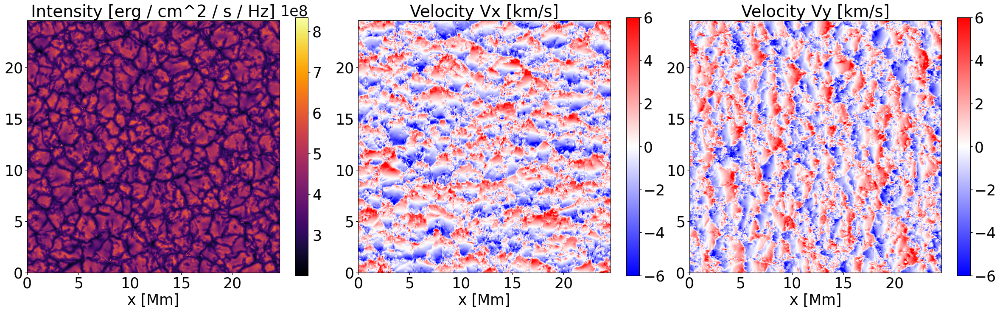

In [13]:
Int=muram.MuramIntensity(path,iter)
plt.rcParams['font.size'] = 25
plt.figure(figsize=(24, 7))
extent = [0, data.shape[1]*0.016, 0, data.shape[1]*0.016]

plt.subplot(1,3,1)
plt.imshow(Int[:, :], cmap='inferno', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Intensity [erg / cm^2 / s / Hz]")



plt.subplot(1,3,2)
plt.imshow(data.vy/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Velocity Vx [km/s]")

plt.subplot(1,3,3)
plt.imshow(data.vz/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Velocity Vy [km/s]")

for ax in plt.gcf().axes:
    ax.title.set_fontsize(28)
plt.subplots_adjust(left=0.03, right=0.99, top=0.95, bottom=0.08, wspace=0.05, hspace=0.05)

plt.savefig('simulation_2D_slice.png')
plt.show()

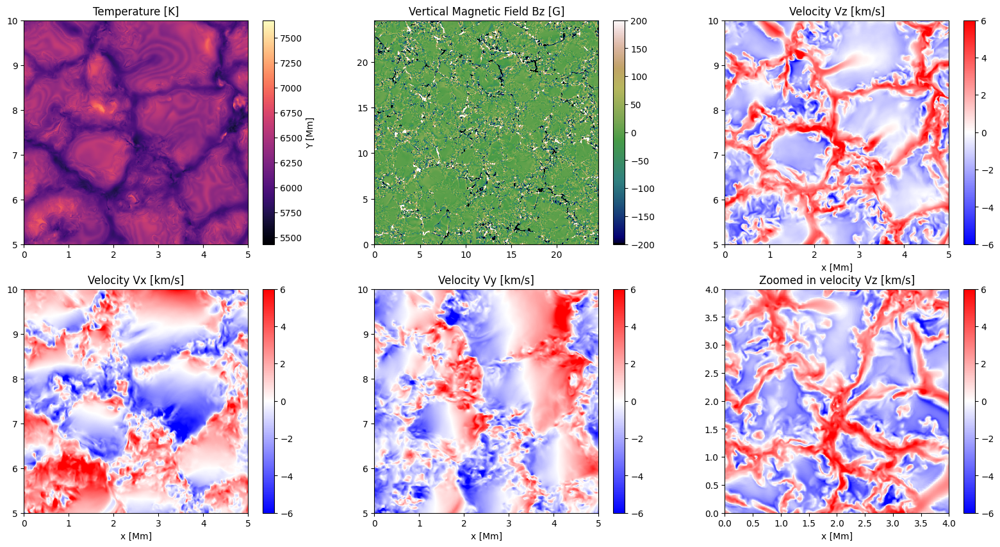

In [12]:

plt.figure(figsize=(20,10))
extent = [0, data.shape[1]*0.016, 0, data.shape[1]*0.016]

plt.subplot(2,3,1)
plt.imshow(data.Temp[:, :], cmap='magma', origin='lower', extent = extent)
plt.colorbar(label='Y [Mm]') 
plt.xlim([0,5])
plt.ylim([5,10])
plt.title(f"Temperature [K]")

plt.subplot(2,3,2)
plt.imshow(data.Bx, cmap='gist_earth', vmin = -200, vmax = 200, origin='lower', extent = extent)
plt.colorbar()
plt.title(f"Vertical Magnetic Field Bz [G]") # I assume that I also invert Bz -> Bx??

plt.subplot(2,3,3)
plt.imshow(-data.vx/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Velocity Vz [km/s]")
plt.xlim([0,5])
plt.ylim([5,10])

plt.subplot(2,3,4)
plt.imshow(data.vy/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Velocity Vx [km/s]")
plt.xlim([0,5])
plt.ylim([5,10])

plt.subplot(2,3,5)
plt.imshow(data.vz/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = extent)
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Velocity Vy [km/s]")
plt.xlim([0,5])
plt.ylim([5,10])

plt.subplot(2,3,6)
plt.imshow(-data.vx[:250,:250]/1e5, vmin = -6, vmax = 6, cmap='bwr', origin='lower', extent = [0, 250*0.016, 0, 250*0.016])
plt.colorbar()
plt.xlabel('x [Mm]')
plt.title(f"Zoomed in velocity Vz [km/s]")

plt.show()

#next task - make a map of divergence
# map div x and y
# map of helicity (rotor vx i vy)
# napraviti plot vorticitya

In [6]:
print(np.min(Int))
print(np.max(Int))

200368640.0
834300600.0


<Figure size 2000x1500 with 0 Axes>

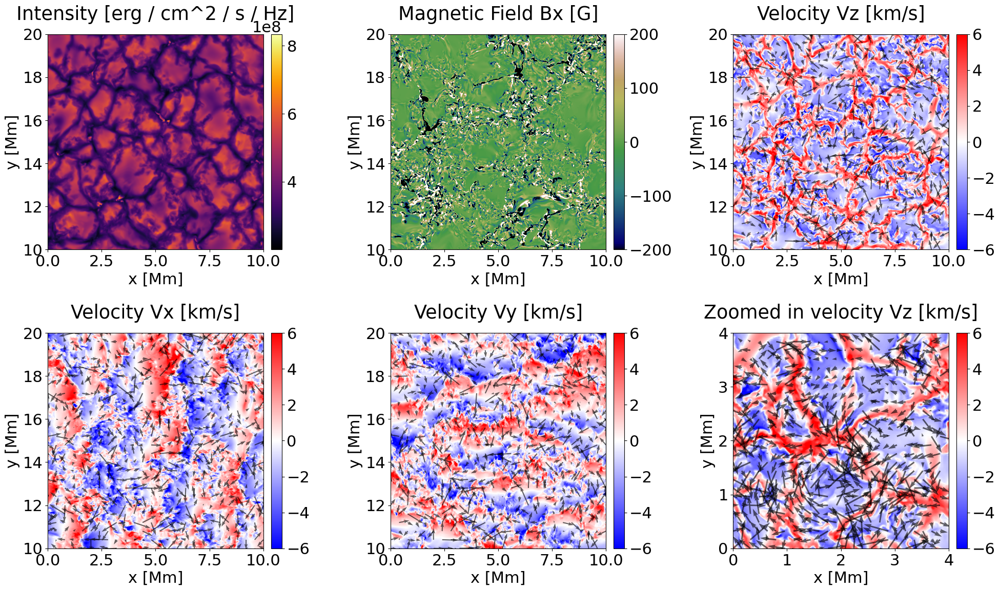

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

plt.figure(figsize=(20,15))
extent = [0, data.shape[1]*0.016, 0, data.shape[1]*0.016]

ny, nx = data.vx.shape  
X, Y = np.meshgrid(np.arange(ny)*0.016, np.arange(nx)*0.016, indexing='ij')

step = 25  
plt.rcParams['font.size'] = 22

def add_colorbar(im, ax, label=None):
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.15)
    cbar = plt.colorbar(im, cax=cax)
    if label:
        cbar.set_label(label)

fig, axs = plt.subplots(2, 3, figsize=(20, 12))


ax = axs[0, 0]
im = ax.imshow(Int, cmap='inferno', origin='lower', extent=extent)
ax.set_xlim([0,10])
ax.set_ylim([10,20])
ax.set_title("Intensity [erg / cm^2 / s / Hz]", pad=20)
ax.set_xlabel('x [Mm]')
ax.set_ylabel('y [Mm]')
add_colorbar(im, ax)


ax = axs[0, 1]
im = ax.imshow(data.Bx.T, cmap='gist_earth', vmin=-200, vmax=200, origin='lower', extent=extent)
ax.set_xlim([0,10])
ax.set_ylim([10,20])
ax.set_title("Magnetic Field Bx [G]", pad=20)
ax.set_ylabel('y [Mm]')
ax.set_xlabel('x [Mm]')
add_colorbar(im, ax)


ax = axs[0, 2]
im = ax.imshow(-data.vx.T/1e5, vmin=-6, vmax=6, cmap='bwr', origin='lower', extent=extent)
quiver = ax.quiver(X[::step, ::step], Y[::step, ::step], 
                   data.vy.T[::step, ::step]/1e5, -data.vx.T[::step, ::step]/1e5, 
                   color='k', scale=80, width=0.005, alpha=0.6)
ax.set_xlabel('x [Mm]')
ax.set_ylabel('y [Mm]')
ax.set_xlim([0,10])
ax.set_ylim([10,20])
ax.set_title("Velocity Vz [km/s]",pad=20)
add_colorbar(im, ax)


ax = axs[1, 0]
im = ax.imshow(data.vy.T/1e5, vmin=-6, vmax=6, cmap='bwr', origin='lower', extent=extent)
quiver = ax.quiver(X[::step, ::step], Y[::step, ::step], 
                   -data.vy.T[::step, ::step]/1e5, data.vx.T[::step, ::step]/1e5, 
                   color='k', scale=80, width=0.005, alpha=0.6)
ax.set_xlabel('x [Mm]')
ax.set_ylabel('y [Mm]')
ax.set_xlim([0,10])
ax.set_ylim([10,20])
ax.set_title("Velocity Vx [km/s]", pad=20)
add_colorbar(im, ax)


ax = axs[1, 1]
im = ax.imshow(data.vz.T/1e5, vmin=-6, vmax=6, cmap='bwr', origin='lower', extent=extent)
quiver = ax.quiver(X[::step, ::step], Y[::step, ::step], 
                   data.vy.T[::step, ::step]/1e5, -data.vx.T[::step, ::step]/1e5, 
                   color='k', scale=80, width=0.005, alpha=0.6)
ax.set_xlabel('x [Mm]')
ax.set_ylabel('y [Mm]')
ax.set_xlim([0,10])
ax.set_ylim([10,20])
ax.set_title("Velocity Vy [km/s]", pad=20)
add_colorbar(im, ax)


ax = axs[1, 2]
step = 10
extent_zoom = [0, 250*0.016, 0, 250*0.016]
im = ax.imshow(-data.vx.T[:250,:250]/1e5, vmin=-6, vmax=6, cmap='bwr', origin='lower', extent=extent_zoom)
quiver = ax.quiver(X[:250, :250][::step, ::step], Y[:250, :250][::step, ::step], 
                   -data.vx.T[:250, :250][::step, ::step]/1e5, 
                   data.vy.T[:250, :250][::step, ::step]/1e5, 
                   color='k', scale=50, width=0.007, alpha=0.6)
ax.set_xlabel('x [Mm]')
ax.set_ylabel('y [Mm]')
ax.set_title("Zoomed in velocity Vz [km/s]", pad=20)
add_colorbar(im, ax)

plt.tight_layout()
plt.savefig('poster_figure_T_B_v.png')
plt.show()


Calculate divergence of v:

In [23]:
print(data.vy.shape)

(1536, 1536)


Text(0.5, 1.0, 'Divergence of V')

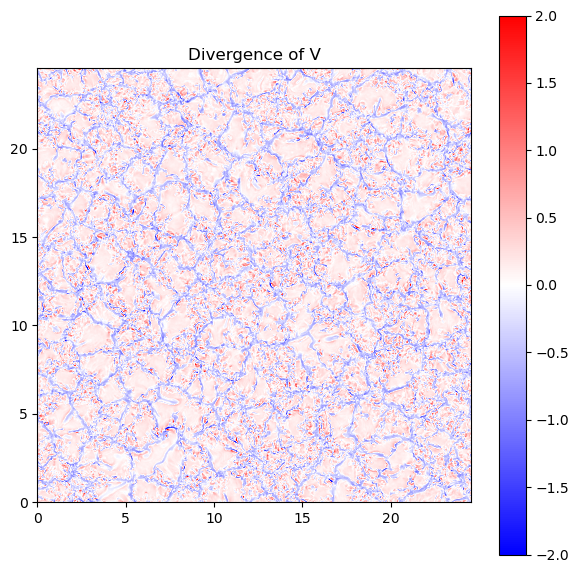

In [10]:
# reference: https://stackoverflow.com/questions/11435809/compute-divergence-of-vector-field-using-python

def divergence(v_x, v_y): #what to do about the unknown dvz_z??
    dvx_x, dvx_y = np.gradient(v_x)
    dvy_x, dvy_y = np.gradient(v_y)

    return dvx_x + dvy_y

div = divergence(data.vy/1e5, data.vz/1e5)

plt.figure(figsize = (7,7))

plt.imshow(div,  cmap='bwr', origin='lower',  vmin = -2, vmax = 2, extent = extent)
plt.colorbar()
#plt.xlim([0,5])
#plt.ylim([5,10])
plt.title("Divergence of V")


Vorticity:

In [11]:
def vorticity(vx, vy):
    dvx_x, dvx_y = np.gradient(vx)
    dvy_x, dvy_y = np.gradient(vy)

    return dvy_x - dvx_y

Text(0.5, 1.0, 'Vorticity of V')

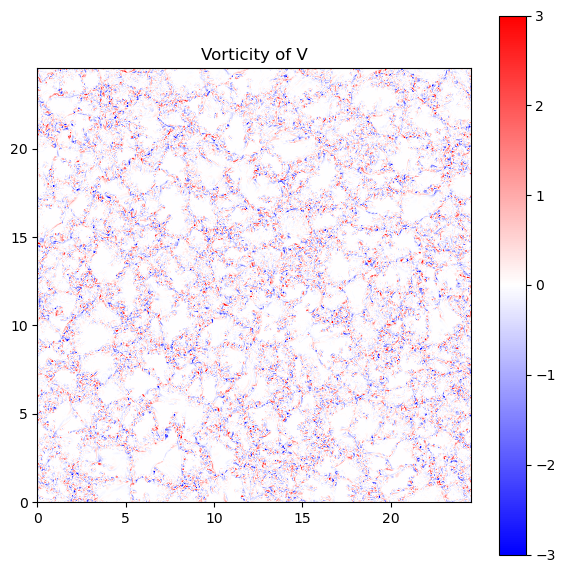

In [14]:
vort = vorticity(data.vy/1e5, data.vz/1e5)

#print(vort)
plt.figure(figsize = (7,7))

plt.imshow(vort,  cmap='bwr', origin='lower', vmin = -3, vmax = 3, extent = extent)
plt.colorbar()
#plt.xlim([0,5])
#plt.ylim([5,10])
plt.title("Vorticity of V")


Helicity

In [15]:
def helicity (vx, vy):
    dvx_x, dvx_y = np.gradient(vx)
    dvy_x, dvy_y = np.gradient(vy)

    return vx*dvy_x + vy*dvx_y

Text(0.5, 1.0, 'Helicity of V')

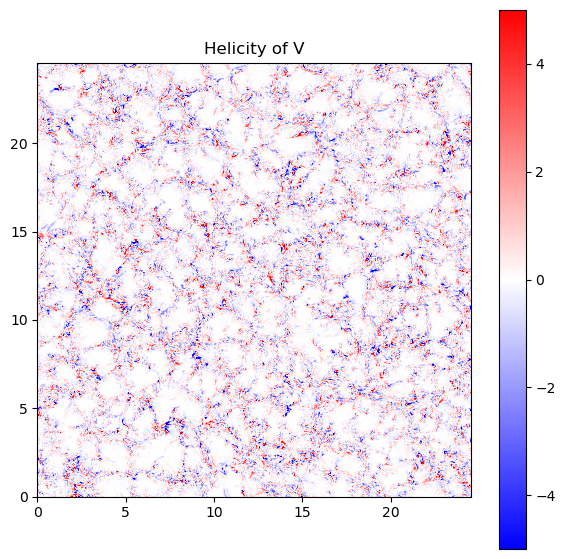

In [17]:
hel = helicity(data.vy/1e5, data.vz/1e5)

plt.figure(figsize = (7,7))

plt.imshow(hel,  cmap='bwr', origin='lower', vmin = -5, vmax = 5, extent = extent)
plt.colorbar()
#plt.xlim([0,5])
#plt.ylim([5,10])
plt.title("Helicity of V")

### Create video:

In [2]:
def image_naming(image_number):
    padding = ""
    if image_number <10:
        padding = "00000"
    elif image_number<100 :
        padding = "0000"
    elif image_number<1000:
        padding = "000"
    elif image_number<10000:
        padding = "00"
    else: padding = "0"
    return "intensity_" + padding + str(image_number) + ".png"

In [4]:
path_intensities = "/dat/milic/"
save_images_path = "/home/xenoss/dat/kecman_project/DeepVel_3D_velocity/images_for_video/"

for i in range(0, 18050, 50):
    Int=muram.MuramIntensity(path_intensities+'2D/',i)
    '''
    plt.figure(figsize=(15,12))
    plt.imshow(Int.T,cmap='afmhot',vmax=7e8,origin='lower')
    plt.title(f"time = {Int.time} sec")
    plt.colorbar()
    plt.savefig(save_images_path + image_naming(i))
    plt.close()
    '''
    

(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)
(1536, 1536)

In [6]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 48.3 MB/s eta 0:00:00m eta 0:00:010:00:01


In [4]:
import cv2
import os

In [5]:
main_path = "/home/xenoss/dat/kecman_project/DeepVel_3D_velocity/"

In [8]:
images = sorted(os.listdir(save_images_path))
print(images[:10])

['intensity_000000.png', 'intensity_000050.png', 'intensity_000100.png', 'intensity_000150.png', 'intensity_000200.png', 'intensity_000250.png', 'intensity_000300.png', 'intensity_000350.png', 'intensity_000400.png', 'intensity_000450.png']


In [10]:
images = sorted(os.listdir(save_images_path))

img_temp = cv2.imread(save_images_path + images[0])
height, width, _ = img_temp.shape

# Create video writer
video = cv2.VideoWriter(main_path + 'intensities.mp4', cv2.VideoWriter_fourcc(*'mp4v'), 5, (width, height))

# Loop over images
for im in images:
    img = cv2.imread(save_images_path + im)
    video.write(img)

video.release()

In [9]:
yz_levels=[0, 192, 384, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500 ]
yz=[]
for level in yz_levels:
    yz.append(muram.MuramSlice(path+'2D/',iter,'yz',f"{level:04d}"))

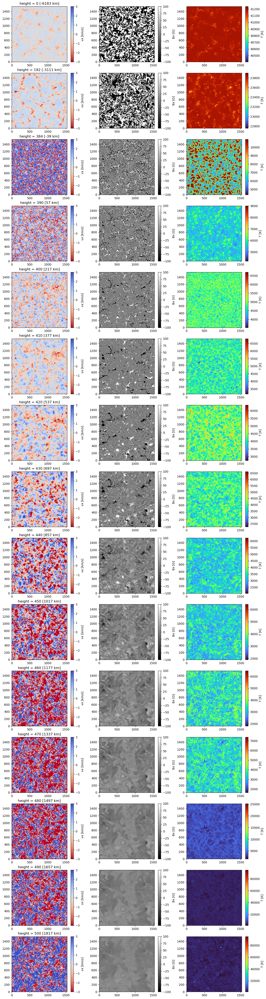

In [10]:
nlevels=len(yz_levels)

plt.figure(figsize=(15,4*nlevels))
for i in range(0,nlevels):
    plt.subplot(nlevels,3,1+3*i)
    plt.imshow((yz[i].vx/1e5).T,cmap='coolwarm_r',vmin=-3,vmax=3,origin='lower')
    plt.colorbar(label='vx [km/s]')
    plt.title(f"height = {yz_levels[i]} [{(yz_levels[i]-tau_ref)*16:.0f} km]")
    plt.subplot(nlevels,3,2+3*i)
    plt.imshow((yz[i].Bx).T,cmap='gray',vmin=-100,vmax=100,origin='lower')
    plt.colorbar(label='Bx [G]')
    plt.subplot(nlevels,3,3+3*i)
    plt.imshow((yz[i].Temp).T,cmap='turbo',origin='lower')
    plt.colorbar(label='T [K]')
plt.show()

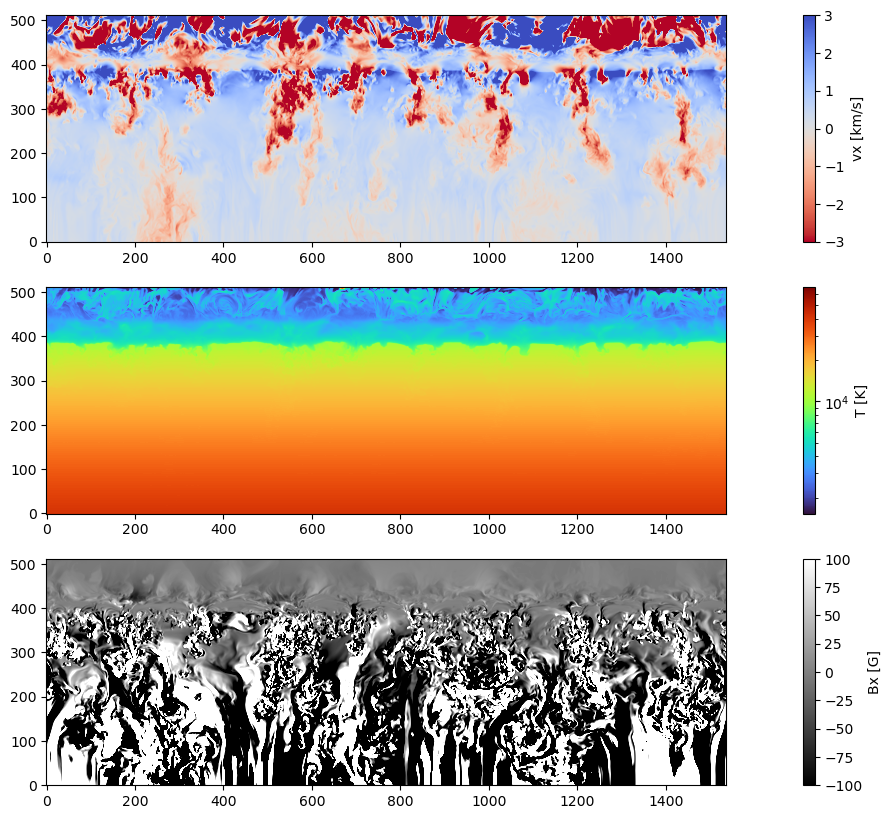

In [11]:
# Vertical slice for context:
xy=muram.MuramSlice(path+'2D/',iter,'xy','0768')

plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.imshow(xy.vx.T/1e5,origin='lower',cmap='coolwarm_r',vmin=-3,vmax=3)
plt.colorbar(label='vx [km/s]')

plt.subplot(3,1,2)
plt.imshow(xy.Temp.T,origin='lower',cmap='turbo',norm=LogNorm())
plt.colorbar(label='T [K]')

plt.subplot(3,1,3)
plt.imshow(xy.Bx.T,origin='lower',cmap='gray',vmin=-100,vmax=100)
plt.colorbar(label='Bx [G]')

plt.show()

In [12]:
# This uses the memmap feature, i.e. this creates only a linkage to the data on disc. 
# The reading happens when you actually do something with the data
# B is not yet multiplied with sqrt(4*pi) since that would cause the memmap to read the whole B cube
# MuramSnap gives the full cube, MuramSubSnap a cutout of the top needed for RT modeling

run1=muram.MuramSubSnap(path+'3D/',iter)
run2=muram.MuramSnap(path+'3D/',iter)

In [13]:
# Variables present (eint-> internal energy, ne -> electron density, Q -> radiative heating/cooling, Qres, Qvis -> heating from numerical diffusivities) 
print(run1.available)
print(run2.available)

# Domain size
print(run1.Temp.shape)
print(run2.Temp.shape)

# Grid spacing, Domain extent, time
print(run1.Temp.dX)
print(run1.Temp.X)
print(run1.Temp.time)

print(run2.Temp.dX)
print(run2.Temp.X)
print(run2.Temp.time)

[]
[]


AttributeError: 'MuramSubSnap' object has no attribute 'Temp'

In [ ]:
run=run1
plt.figure(figsize=(20,10))
plt.subplot(3,1,1)
plt.imshow(run.vx[:,:,0]/1e5,origin='lower',cmap='coolwarm_r',vmin=-3,vmax=3)
plt.colorbar(label='vx [km/s]')

plt.subplot(3,1,2)
plt.imshow(run.Temp[:,:,0],origin='lower',cmap='turbo',norm=LogNorm())
plt.colorbar(label='T [K]')

plt.subplot(3,1,3)
plt.imshow(run.Bx[:,:,0]*B_unit,origin='lower',cmap='gray',vmin=-100,vmax=100)
plt.colorbar(label='Bx [G]')

plt.show()

In [ ]:
run=run2

plt.figure(figsize=(20,15))
plt.subplot(3,1,1)
plt.imshow(run.vx[:,:,0]/1e5,origin='lower',cmap='coolwarm_r',vmin=-3,vmax=3)
plt.colorbar(label='vx [km/s]')

plt.subplot(3,1,2)
plt.imshow(run.Temp[:,:,0],origin='lower',cmap='turbo',norm=LogNorm())
plt.colorbar(label='T [K]')

plt.subplot(3,1,3)
plt.imshow(run.Bx[:,:,0]*B_unit,origin='lower',cmap='gray',vmin=-100,vmax=100)
plt.colorbar(label='Bx [G]')

plt.show()